# Quiz 3a - Implementation of the Harris Corner Detection

**Eugenio Pacceli**

**Renato Oliveira**

**Brayan Acevedo**

First task consisted of creating three masks with shapes (3x3), (5x5) and (7x7) based on Butterworth filter.

It was also required to use filter orders n of {1,4} and cut-off frequencies D0 = {10,1}

Image size should be width=640 x height=480

In [1]:
%matplotlib inline
import numpy as np
import cv2
import matplotlib.pyplot as plt
from scipy.ndimage import filters
from PIL import Image
from numpy import *
from pylab import *
from pandas import *
#image is height: 480, width: 640

# tolerance for 0 divisions (resulting in inf)
# and other errors (resulting in NaN)
np.seterr(divide='ignore', invalid='ignore')

#M:u:x:col:width
#N:v:y:row:height


{'divide': 'warn', 'invalid': 'warn', 'over': 'warn', 'under': 'ignore'}

In [2]:
#Compute the Algorithm Harris corner detecion for implementation in grayscale image
def compute_harris(img, sigma=3):
    #print(img.size)
    #compute derivates in the image 
    imx = np.zeros(img.size)
    imy = np.zeros(img.size)
    #print(imx)
    imx = filters.gaussian_filter(img, (sigma,sigma), (0,1))
    imy = filters.gaussian_filter(img, (sigma,sigma), (1,0))
    
    # compute components of the Harris matrix // coeficientes da matriz M
    Wxx = filters.gaussian_filter(imx*imx,sigma)
    Wxy = filters.gaussian_filter(imx*imy,sigma)
    Wyy = filters.gaussian_filter(imy*imy,sigma)
    
    # determinant and trace
    Wdet = Wxx*Wyy - Wxy**2
    Wtr = Wxx + Wyy
    #r = Wdet - 0.5*(Wtr**2)
    harris = np.divide(Wdet, Wtr)
    harris[np.isposinf(harris)] = 0
    harris[np.isnan(harris)] = 0
    return harris

def get_harris_points(harrisim,min_dist=10,threshold=0.1):
    #Return corners from a Harris response image
    #min_dist is the minimum number of pixels separating
    #corners and image boundary. 
    global t 
    global dist
    dist=min_dist
    t=threshold
    #print(t)
    # find top corner candidates above a threshold
    corner_threshold = harrisim.max() * threshold
        
    harrisim_t = (harrisim > corner_threshold) * 1
    # get coordinates of candidates
    coords = array(harrisim_t.nonzero()).T
    # ...and their values
    candidate_values = [harrisim[c[0],c[1]] for c in coords]
    # sort candidates
    index = argsort(candidate_values)
    # store allowed point locations in array
    allowed_locations = zeros(harrisim.shape)
    allowed_locations[min_dist:-min_dist,min_dist:-min_dist] = 1
    # select the best points taking min_distance into account
    filtered_coords = []
    for i in index:
        if allowed_locations[coords[i,0],coords[i,1]] == 1:
            filtered_coords.append(coords[i])
            allowed_locations[(coords[i,0]-min_dist):(coords[i,0]+min_dist),
            (coords[i,1]-min_dist):(coords[i,1]+min_dist)] = 0
    return filtered_coords

def plot_harris_points(image,filtered_coords):
    #""" Plots corners found in image. """
    plt.imshow(image)
    plt.title('Harris corner detection, dist=%s and threshold=%s'%(dist,t))
    plt.plot([p[1] for p in filtered_coords],[p[0] for p in filtered_coords],'*',color = 'r')
    plt.axis('off')
    plt.show()

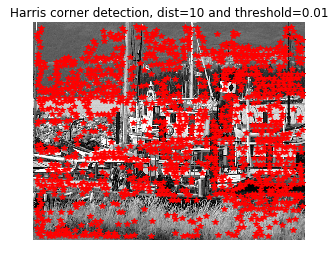

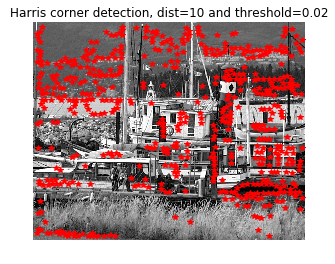

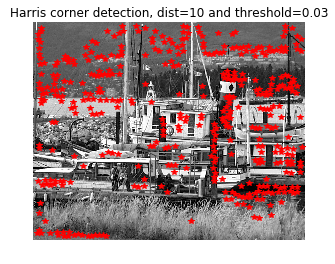

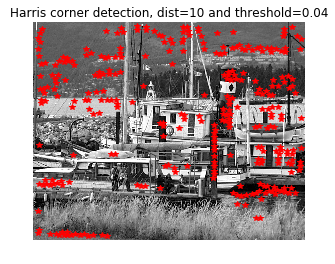

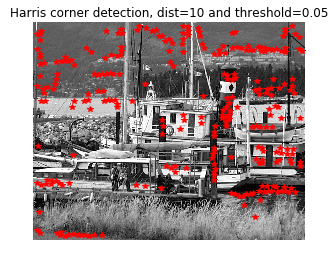

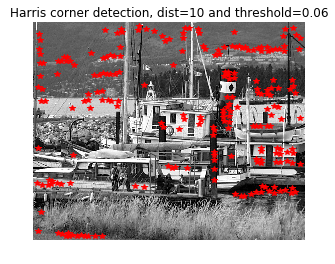

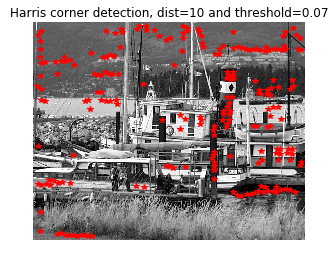

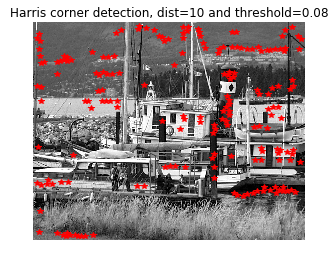

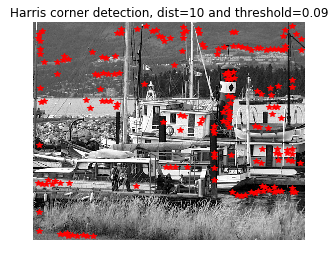

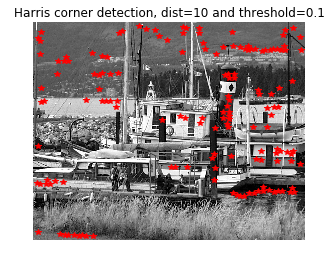

In [4]:
im = Image.open('boat_images/img1.pgm')
#print(im)
#figsize(20, 12)
plt.figure(figsize=(20,12))
figure()
gray()
plt.imshow(im, cmap = 'gray')
#plt.show()

#img = (Image.open('boat_images/img1.pgm').convert('L'))
#plt.imshow(im1, cmap = 'gray')
#plt.show()
harrisim = compute_harris(im)
#print(harrisim)

for i in range(1, 11,1):
        xx=i* 0.01
        j=10
        filtered_coords = get_harris_points(harrisim,j,xx)
        plot_harris_points(im, filtered_coords)
    


# Quiz 3b - Implementation of the SIFT Feature Detector

Populating the interactive namespace from numpy and matplotlib


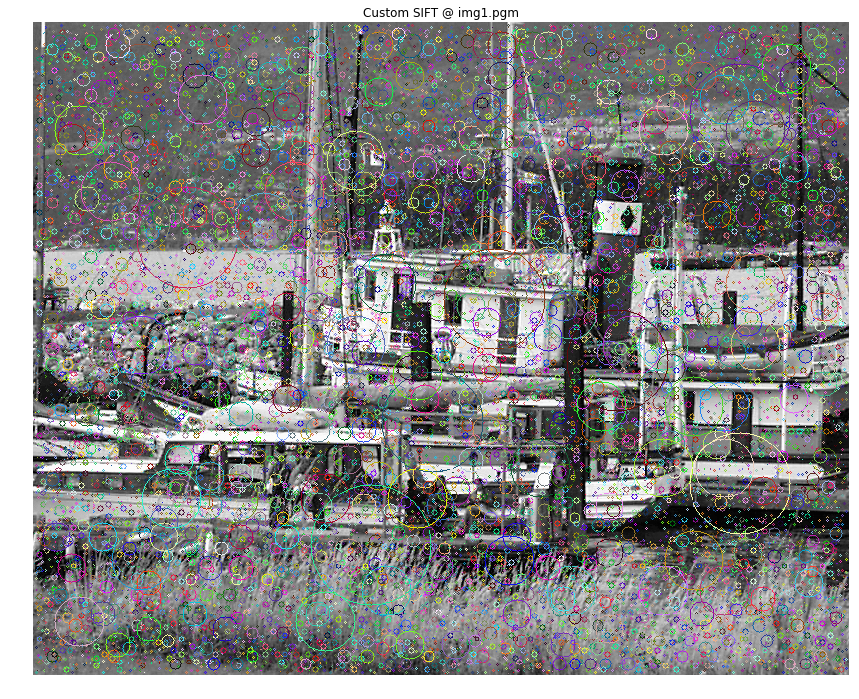

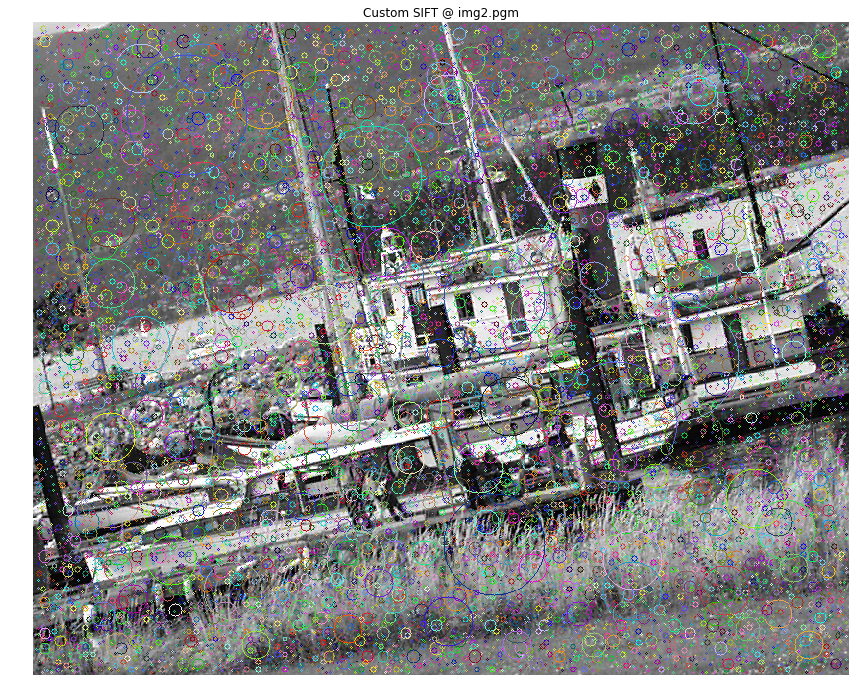

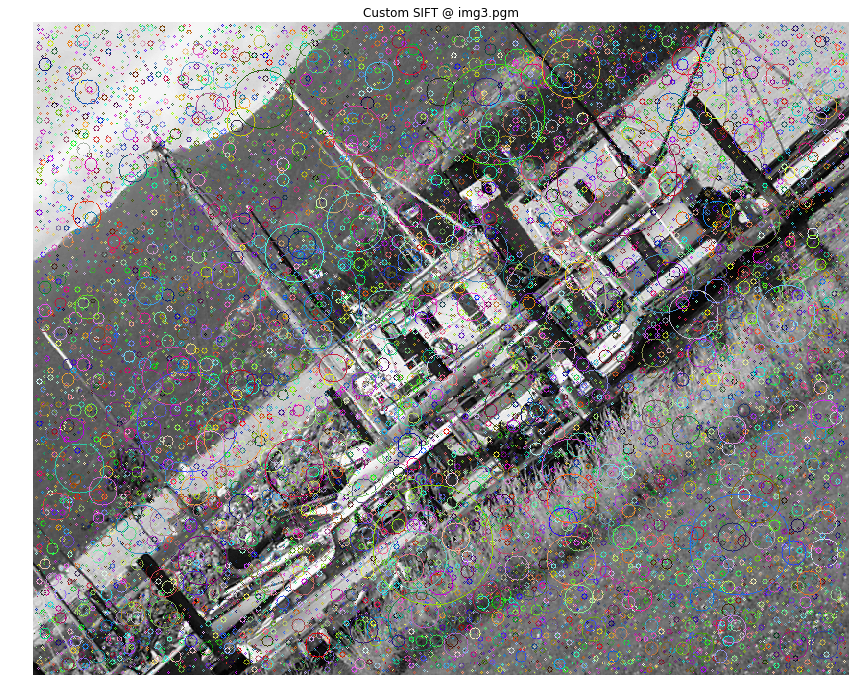

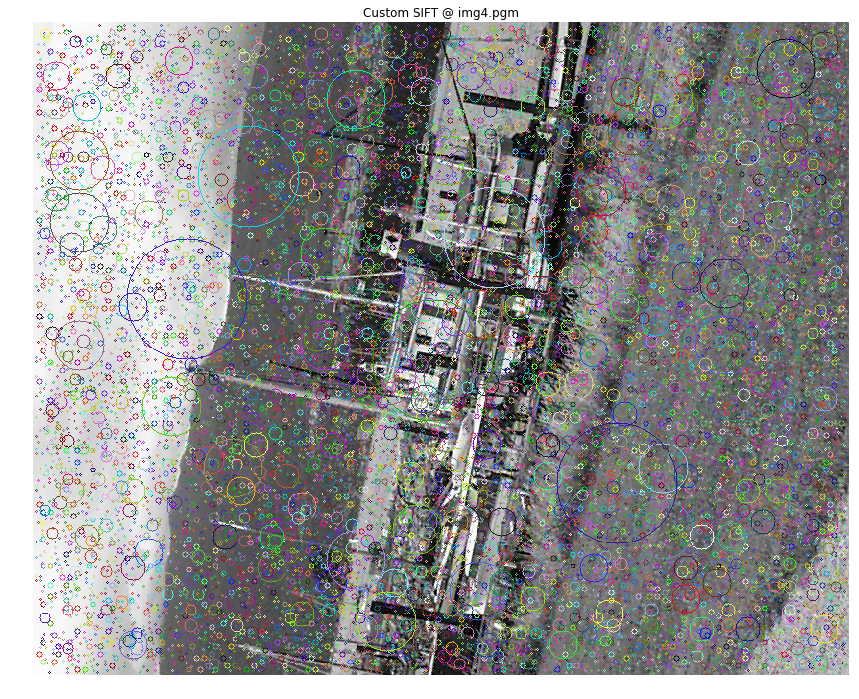

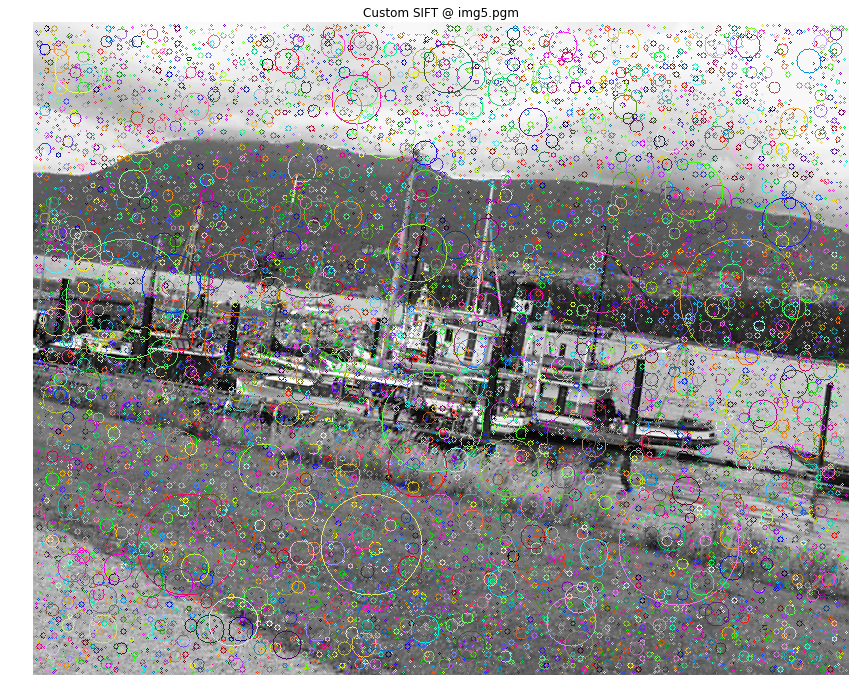

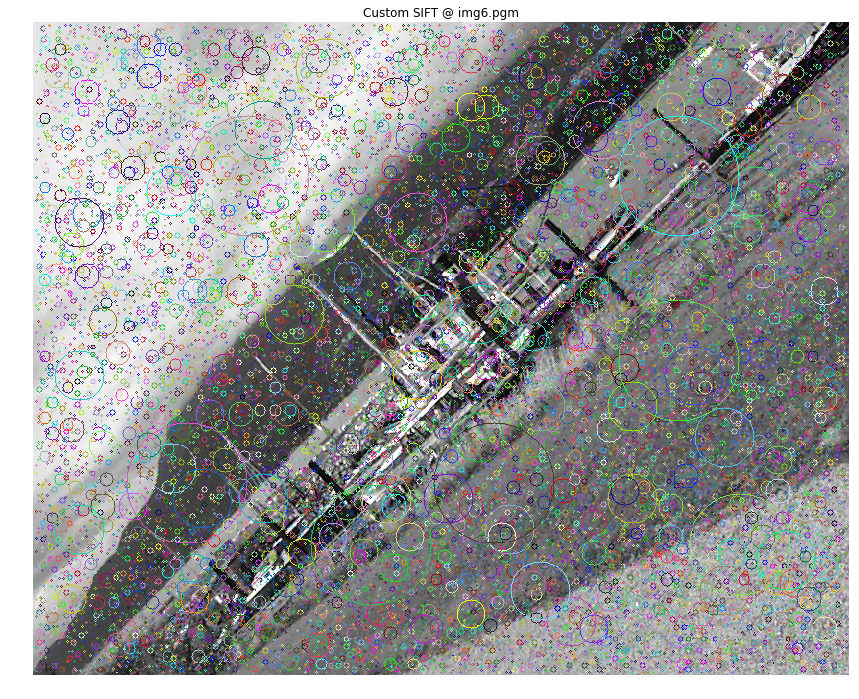

In [9]:
%pylab inline
import cv2 as cv
import numpy as np
import random as rnd
import matplotlib.pyplot as plt
import os

PATH = ".\\boat_images\\"

def getGaussianKernel(sigma, kernelHeight=7, kernelWidth=7):
    assert(kernelHeight % 2 == 1 and kernelWidth % 2 == 1)

    yOffset = (kernelHeight - 1) / 2
    xOffset = (kernelWidth - 1) / 2

    kernel = np.ndarray((kernelHeight, kernelWidth), np.float64)
    
    intYOffset = int(yOffset)
    intXOffset = int(xOffset)
    
    for y in range(-intYOffset, intYOffset+1, 1):
        for x in range(-intXOffset, intXOffset+1, 1):
            kernel[y+intYOffset][x+intXOffset] = (1. / (2.*np.pi*sigma**2)) * np.exp(-(x**2 + y**2) / (2 * sigma**2))

    kernel /= kernel.sum()
    return kernel


def calcGaussianPyramid(org_img):
    img = org_img.copy()
    bluredImg = img.copy()

    sigma = 0.7

    octaveCount = 7
    sigmaCount = 4
    
    gp = np.ndarray(shape=(octaveCount,), dtype=np.ndarray)

    for o in range(0, octaveCount):
        gp[o] = np.ndarray(shape=(sigmaCount+1, img.shape[0], img.shape[1]), dtype=np.float64)
        gp[o][0] = bluredImg.copy()
        for s in range(1, sigmaCount + 1):
            k = 2**(float(s)/float(sigmaCount))
            kernel = getGaussianKernel(k*sigma)
            bluredImg = cv.filter2D(img, -1, kernel)
            gp[o][s] = bluredImg.copy()

        if (o < octaveCount-1):
            #sigma *= 2
            img = downscale(img)
            bluredImg = downscale(bluredImg)

    return gp

def calcDifference(img0, img1, threshold = 0):
    assert(img0.shape == img1.shape)
 
    diffImg = np.ndarray(img0.shape, np.float64)

    for y in range(diffImg.shape[0]):
        for x in range(diffImg.shape[1]):
            difference = abs(img1[y][x] - img0[y][x])
            if difference > threshold:
                diffImg[y][x] = difference
            else:
                diffImg[y][x] = 0

    return diffImg


def calcDoG(gp):

    DoG = np.ndarray(shape=gp.shape, dtype=np.ndarray)

    for o in range(DoG.shape[0]):
        DoG[o] = np.ndarray(shape=(gp[o].shape[0]-1, gp[o].shape[1], gp[o].shape[2]), dtype=np.float64)
        for s in range(DoG[o].shape[0]):
            DoG[o][s] = calcDifference(gp[o][s], gp[o][s+1])

    return DoG

def getNeighbourhood(octave, s, y, x, radius=1):
    neighbourhood = octave[s-radius:s+radius+1, y-radius:y+radius+1, x-radius:x+radius+1]

    return neighbourhood

def calcExtrema(DoG, threshold=1, radius=1):
    keypoints = np.ndarray(shape=DoG.shape, dtype=np.ndarray)

    sigma = 0.7
    sigmaCount = DoG[0].shape[0]

    for o in range(DoG.shape[0]):
        keypoints[o] = np.ndarray(shape=(DoG[o].shape[0]-(2*radius),), dtype=list)
        for s in range(radius, DoG[o].shape[0]-radius):
            keypoints[o][s-radius] = []
            k = 2**(float(s)/float(sigmaCount))
            
            for y in range(radius, DoG[o].shape[1]-radius):
                for x in range(radius, DoG[o].shape[2]-radius):
                    value = DoG[o][s, y, x]
                    neighbourhood = getNeighbourhood(DoG[o], s, y, x, radius=radius).flatten()
                    neighbourhood.sort()
                    min2 = neighbourhood[1]
                    max2 = neighbourhood[-2]
                    if value < min2 or (value > threshold and value > max2):
                        scale = 2**o
                        keypoints[o][s-radius].append((scale * y + scale/2, scale * x + scale/2, scale * k*sigma))

    return keypoints

def drawKeypoints(img, kp):
    if (len(img.shape) < 3 or img.shape[2] == 1):
        kpImg = cv.cvtColor(img, cv.COLOR_GRAY2BGR)
    else:
        kpImg = img.copy()
    for y, x, scale in kp:
        r = rnd.randrange(0,255)
        g = rnd.randrange(0,255)
        b = rnd.randrange(0,255)
        cv.circle(kpImg, (int(x), int(y)), int(scale), (r, g, b))

    return kpImg

def plotImage(title,image):
    figsize(20, 12)
    figure()
    gray()
    plt.imshow(image)
    plt.title(title)
    plt.axis('off')
    plt.show()

def normalize(img):
    normImg = np.ndarray(shape=img.shape, dtype=np.float64)

    max = img.max()
    if max > 0:
        normImg = img/float(max)
        normImg *= 255.
    else:
        return img.copy()

    return normImg.astype(np.uint8)

def scale(img, factor=2):
    assert(len(img.shape) == 2)
    rows, cols = img.shape
    scaledImg = np.ndarray((rows*factor, cols*factor), np.float64)

    for y in range(0, scaledImg.shape[0]):
        for x in range(0, scaledImg.shape[1]):
            scaledImg[y][x] = img[int(y/factor)][int(x/factor)]

    return scaledImg

def downscale(img):
    assert(len(img.shape) == 2)
    rows, cols = img.shape
    scaledImg = np.ndarray((int(rows/2), int(cols/2)), np.float64)

    for y in range(0, scaledImg.shape[0]):
        for x in range(0, scaledImg.shape[1]):
            scaledImg[y][x] = img[2*y][2*x]

    return scaledImg

    
def SIFT():
    for filename in os.listdir(PATH):
        img = cv.imread(PATH+filename, cv.IMREAD_GRAYSCALE)

        gp = calcGaussianPyramid(img)
        DoG = calcDoG(gp)

        radius = 1
        keypoints = calcExtrema(DoG, radius=radius)
        kpImg = img.copy()
        for o in range(keypoints.shape[0]):
            for s in range(radius, DoG[o].shape[0]-radius):
                kp = keypoints[o][s-radius]
                kpImg = drawKeypoints(kpImg, kp)
        plotImage("Custom SIFT @ "+filename, kpImg)

SIFT()